<a href="https://colab.research.google.com/github/aayush1324/Scaler_DSML2022/blob/main/ZEE5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Import Library**

In [ ]:
import re
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from datetime import datetime

In [ ]:
from scipy.stats import binom , norm , poisson , expon ,geom

In [ ]:
from scipy.stats import ttest_ind , ttest_rel , f_oneway , kruskal
from scipy.stats import norm , chi2 , f
from scipy.stats import chi2_contingency , chisquare
from scipy.stats import pearsonr , spearmanr
from scipy.stats import kstest

In [ ]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import mean_absolute_percentage_error as mape
from sklearn.metrics import r2_score
from sklearn.metrics import explained_variance_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import auc


In [ ]:
from sklearn import cluster
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch

In [ ]:
from collections import defaultdict
from scipy import sparse
from scipy.stats import pearsonr
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.neighbors import NearestNeighbors
import warnings
warnings.filterwarnings("ignore")

In [ ]:
!pip install cmfrec

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from cmfrec import CMF

In [ ]:
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules
from sklearn.ensemble import GradientBoostingRegressor

In [ ]:
from collections import defaultdict 
from scipy import sparse
from scipy.stats import pearsonr
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.neighbors import NearestNeighbors
import warnings
from statsmodels.stats.outliers_influence import variance_inflation_factor


# ***Import Dataset***

In [ ]:
warnings.simplefilter("ignore") 
pd.set_option("display.max_columns", None) 
pd.options.display. float_format='{:.2f}'.format 
sns.set_style('white')

## **Movies**

In [ ]:
# movie = pd.read_csv("zee-movies.dat" , encoding="ISO-8859-1" , sep = '::' , engine = "python")
# movie.head()

In [ ]:
movies = pd.read_fwf("zee-movies.dat" , encoding="ISO-8859-1")
movies.drop(columns=['Unnamed: 1', 'Unnamed: 2'], axis=1, inplace=True)
delimiter = "::"
movies = movies['Movie ID::Title::Genres'].str.split(delimiter, expand=True)
movies.columns = ['Movie ID', 'Title', 'Genres']
movies.rename(columns = {'Movie ID': 'MovieID'}, inplace=True)
movies.head()


,MovieID,Title,Genres
0,1,Toy Story (1995),Animation|Children's|Comedy
1,2,Jumanji (1995),Adventure|Children's|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama
4,5,Father of the Bride Part II (1995),Comedy


### ***Checking***

In [ ]:
movies.shape

(3883, 3)

In [ ]:
movies.duplicated().sum()

0

In [ ]:
movies.isnull().sum()

MovieID     0
Title       0
Genres     25
dtype: int64

In [ ]:
movies[movies["Genres"].isnull()]

,MovieID,Title,Genres
62,63,Don't Be a Menace to South Central While Drink...,None
197,199,"Umbrellas of Cherbourg, The (Parapluies de Che...",None
359,363,"Wonderful, Horrible Life of Leni Riefenstahl, ...",None
464,468,"Englishman Who Went Up a Hill, But Came Down a...",None
720,729,"Institute Benjamenta, or This Dream People Cal...",None
740,750,Dr. Strangelove or: How I Learned to Stop Worr...,None
783,793,My Life and Times With Antonin Artaud (En comp...,None
787,797,"Old Lady Who Walked in the Sea, The (Vieille q...",None
1134,1150,"Return of Martin Guerre, The (Retour de Martin...",None
1160,1176,"Double Life of Veronique, The (La Double Vie d...",None


In [ ]:
movies = movies.dropna(how = "any")

In [ ]:
movies.isnull().sum()

MovieID    0
Title      0
Genres     0
dtype: int64

In [ ]:
movies.shape

(3858, 3)

## **Ratings**

In [ ]:
# rating = pd.read_csv('zee-ratings.dat', encoding="ISO-8859-1" , sep = '::' , engine = "python")
# rating.head()

In [ ]:
ratings = pd.read_fwf('zee-ratings.dat', encoding="ISO-8859-1")
delimiter = "::"
ratings = ratings['UserID::MovieID::Rating::Timestamp'].str.split(delimiter, expand=True)                                                    
ratings.columns = ['UserID', 'MovieID', 'Rating', 'Timestamp'] 
ratings.head()

,UserID,MovieID,Rating,Timestamp
0,1,1193,5,978300760
1,1,661,3,978302109
2,1,914,3,978301968
3,1,3408,4,978300275
4,1,2355,5,978824291


### ***Checking***

In [ ]:
ratings.shape

(1000209, 4)

In [ ]:
ratings.duplicated().sum()

0

In [ ]:
ratings.isnull().sum()

UserID       0
MovieID      0
Rating       0
Timestamp    0
dtype: int64

In [ ]:
ratings.shape

(1000209, 4)

## **Users**

In [ ]:
# user = pd.read_csv('zee-users.dat', encoding='ISO-8859-1' , sep = '::' , engine = "python")
# user.head()

In [ ]:
users = pd.read_fwf('zee-users.dat', encoding='ISO-8859-1')
delimiter = "::"
users = users['UserID::Gender::Age::Occupation::Zip-code'].str.split(delimiter, expand=True)
users.columns = ['UserID', 'Gender', 'Age', 'Occupation', 'Zip-code'] 
users.head()

,UserID,Gender,Age,Occupation,Zip-code
0,1,F,1,10,48067
1,2,M,56,16,70072
2,3,M,25,15,55117
3,4,M,45,7,02460
4,5,M,25,20,55455


In [ ]:
users1 = users.copy()

In [ ]:
users.replace({"Age" : {'1': "Under 18",
                       '18': "18-24",
                       '25': "25-34",
                       '35': "35-44",
                       '45': "45-49",
                       '50': "50-55",
                       '56': "56+"}} , inplace = True)

In [ ]:
users.head()

,UserID,Gender,Age,Occupation,Zip-code
0,1,F,Under 18,10,48067
1,2,M,56+,16,70072
2,3,M,25-34,15,55117
3,4,M,45-49,7,02460
4,5,M,25-34,20,55455


In [ ]:
users.replace({"Occupation" : {'0': "other",
                               '1': "academic/educator",
                               '2': "artist",
                               '3': "clerical/admin",
                               '4': "college/grad student",
                               '5': "customer service",
                               '6': "doctor/health care",
                               '7': "executive/managerial",
                               '8': "farmer",
                               '9': "homemaker",
                               '10': "K-12 student",
                               '11': "lawyer",
                               '12': "programmer",
                               '13': "retired",
                               '14': "sales/marketing",
                               '15': "scientist",
                               '16': "self-employed",
                               '17': "technician/engineer",
                               '18': "tradesman/craftsman",
                               '19': "unemployed",
                               '20': "writer"}} , inplace = True)

In [ ]:
users.head()

,UserID,Gender,Age,Occupation,Zip-code
0,1,F,Under 18,K-12 student,48067
1,2,M,56+,self-employed,70072
2,3,M,25-34,scientist,55117
3,4,M,45-49,executive/managerial,02460
4,5,M,25-34,writer,55455


### ***Checking***

In [ ]:
users.shape

(6040, 5)

In [ ]:
users.duplicated().sum()

0

In [ ]:
users.isnull().sum()

UserID        0
Gender        0
Age           0
Occupation    0
Zip-code      0
dtype: int64

In [ ]:
users.shape

(6040, 5)

# **Feature Engineering**

In [ ]:
movies.head()

,MovieID,Title,Genres
0,1,Toy Story (1995),Animation|Children's|Comedy
1,2,Jumanji (1995),Adventure|Children's|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama
4,5,Father of the Bride Part II (1995),Comedy


In [ ]:
movies.shape

(3858, 3)

In [ ]:
movies["Release_year"] = movies["Title"].str.findall('\((\d{4})\)').str.get(0)

In [ ]:
movies["Release_Decade"] = (((movies["Release_year"].astype("int64") % 100)//10)*10).astype("object")

In [ ]:
movies.head()

,MovieID,Title,Genres,Release_year,Release_Decade
0,1,Toy Story (1995),Animation|Children's|Comedy,1995,90
1,2,Jumanji (1995),Adventure|Children's|Fantasy,1995,90
2,3,Grumpier Old Men (1995),Comedy|Romance,1995,90
3,4,Waiting to Exhale (1995),Comedy|Drama,1995,90
4,5,Father of the Bride Part II (1995),Comedy,1995,90


# **Merging DataFrame**

In [ ]:
df = ratings.merge(movies , on = "MovieID").merge(users , on = "UserID")

In [ ]:
df.head()

,UserID,MovieID,Rating,Timestamp,Title,Genres,Release_year,Release_Decade,Gender,Age,Occupation,Zip-code
0,1,1193,5,978300760,One Flew Over the Cuckoo's Nest (1975),Drama,1975,70,F,Under 18,K-12 student,48067
1,1,661,3,978302109,James and the Giant Peach (1996),Animation|Children's|Musical,1996,90,F,Under 18,K-12 student,48067
2,1,914,3,978301968,My Fair Lady (1964),Musical|Romance,1964,60,F,Under 18,K-12 student,48067
3,1,3408,4,978300275,Erin Brockovich (2000),Drama,2000,0,F,Under 18,K-12 student,48067
4,1,2355,5,978824291,"Bug's Life, A (1998)",Animation|Children's|Comedy,1998,90,F,Under 18,K-12 student,48067


In [ ]:
len(df)

996144

In [ ]:
df.duplicated(subset = ["UserID" , "MovieID"]).sum()

0

In [ ]:
user_ratings = df[['UserID','Rating']].groupby('UserID').mean()

# **Data Observations**

In [ ]:
len(df)

996144

In [ ]:
df.shape

(996144, 12)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 996144 entries, 0 to 996143
Data columns (total 12 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   UserID          996144 non-null  object
 1   MovieID         996144 non-null  object
 2   Rating          996144 non-null  object
 3   Timestamp       996144 non-null  object
 4   Title           996144 non-null  object
 5   Genres          996144 non-null  object
 6   Release_year    996144 non-null  object
 7   Release_Decade  996144 non-null  object
 8   Gender          996144 non-null  object
 9   Age             996144 non-null  object
 10  Occupation      996144 non-null  object
 11  Zip-code        996144 non-null  object
dtypes: object(12)
memory usage: 98.8+ MB


In [ ]:
df.describe()

,UserID,MovieID,Rating,Timestamp,Title,Genres,Release_year,Release_Decade,Gender,Age,Occupation,Zip-code
count,996144,996144,996144,996144,996144,996144,996144,996144,996144,996144,996144,996144
unique,6040,3682,5,457632,3682,358,81,10,2,7,21,3439
top,4169,2858,4,975528402,American Beauty (1999),Comedy,1999,90,M,25-34,college/grad student,94110
freq,2303,3428,347758,30,3428,116691,86833,532115,750590,394105,130626,3782


In [ ]:
#df.duplicated().sum()

In [ ]:
df.isnull().sum()

UserID            0
MovieID           0
Rating            0
Timestamp         0
Title             0
Genres            0
Release_year      0
Release_Decade    0
Gender            0
Age               0
Occupation        0
Zip-code          0
dtype: int64

In [ ]:
percent_missing = (df.isnull().sum()/len(df))*100
percent_missing

UserID           0.00
MovieID          0.00
Rating           0.00
Timestamp        0.00
Title            0.00
Genres           0.00
Release_year     0.00
Release_Decade   0.00
Gender           0.00
Age              0.00
Occupation       0.00
Zip-code         0.00
dtype: float64

In [ ]:
df.dtypes

UserID            object
MovieID           object
Rating            object
Timestamp         object
Title             object
Genres            object
Release_year      object
Release_Decade    object
Gender            object
Age               object
Occupation        object
Zip-code          object
dtype: object

In [ ]:
count = 0
for i in range (len(users["Zip-code"])):

  if (len(users["Zip-code"][i]) != 5):
    count += 1
    print(users["Zip-code"][i])

print()
print("Number of Zip-Code which length is not equal to 5 =" , count)


98107-2117
37919-4204
55337-4056
55405-2546
55103-1006
5849574
52570-9634
01702-7224
20744-6223
20110-5616
48103-8929
53404-1230
68144-2410
345567
93420-2852
84112-2004
2020010
495321
92612-3417
23464-3016
72227-5733
92683-1892
98043-3621
11710-1641
33067-1400
02136-1522
37923-3112
495321
27713-9225
88005-4313
95451-9554
48103-4711
64081-8102
80004-4448
50265-2850
444555
08854-3115
27514-3540
15701-1348
91790-1161
29404-2205
400060
62263-3004
01904-1355
70809-2612
361069
92711-0571
94930-2010
49503-1313
48316-5601
11510-2001
62330-1408
11414-2520
111225
15701-2017
45322-3132
0956456
90014-1718
96707-1321
19087-3622
96707-1321
970025
63123-1507
949702
84109-2001
193122042
77565-2332
62025-8000
02725-1010
11230-1710
20003-2712
20120-6354
85287-2702
191004
12833-2000
10461-1301
23455-4959
954025
90035-4444
73069-5429
78705-5221

Number of Zip-Code which length is not equal to 5 = 81


# **EDA**

## **Categorical Column**

In [ ]:
cat_col = (df.dtypes == "object")
cat_col = list(cat_col[cat_col].index)
cat_col

['UserID',
 'MovieID',
 'Rating',
 'Timestamp',
 'Title',
 'Genres',
 'Release_year',
 'Release_Decade',
 'Gender',
 'Age',
 'Occupation',
 'Zip-code']

In [ ]:
for cat in cat_col:
  print(cat)
  print(df[cat].nunique())
  print("")

UserID
6040

MovieID
3682

Rating
5

Timestamp
457632

Title
3682

Genres
358

Release_year
81

Release_Decade
10

Gender
2

Age
7

Occupation
21

Zip-code
3439



In [ ]:
for cat in cat_col:
  print(cat)
  print(df[cat].unique())
  print("")

UserID
['1' '2' '12' ... '2982' '3893' '4211']

MovieID
['1193' '661' '914' ... '402' '872' '684']

Rating
['5' '3' '4' '2' '1']

Timestamp
['978300760' '978302109' '978301968' ... '965318885' '965319138'
 '965319197']

Title
["One Flew Over the Cuckoo's Nest (1975)"
 'James and the Giant Peach (1996)' 'My Fair Lady (1964)' ...
 'Open Season (1996)' 'Aiqing wansui (1994)' 'Windows (1980)']

Genres
['Drama' "Animation|Children's|Musical" 'Musical|Romance'
 "Animation|Children's|Comedy" 'Action|Adventure|Comedy|Romance'
 'Action|Adventure|Drama' 'Comedy|Drama' "Animation|Children's|Music"
 "Adventure|Children's|Drama|Musical" 'Musical' 'Comedy'
 "Animation|Children's" 'Comedy|Fantasy' 'Animation' 'Comedy|Sci-Fi'
 'Drama|War' 'Romance' "Animation|Children's|Musical|Romance"
 "Children's|Drama|Fantasy|Sci-F" 'Drama|Romance'
 'Animation|Comedy|Thriller'
 "Adventure|Animation|Children's|Comedy|Musical"
 "Animation|Children's|Comedy|Musical" 'Thriller' 'Action|Crime|Romance'
 'Action|Adventur

In [ ]:
for cat in (cat_col):
  print(df[cat].value_counts())
  print("")
  print("")

4169    2303
1680    1841
4277    1735
1941    1590
1181    1514
        ... 
5168      20
5258      19
3324      19
3222      19
5533      19
Name: UserID, Length: 6040, dtype: int64


2858    3428
260     2991
1196    2990
1210    2883
480     2672
        ... 
142        1
1908       1
1764       1
2584       1
684        1
Name: MovieID, Length: 3682, dtype: int64


4    347758
3    260473
5    224639
2    107261
1     56013
Name: Rating, dtype: int64


975528402     30
975527781     28
975440712     28
975528243     27
1025585635    27
              ..
974786216      1
974778426      1
974778392      1
974778292      1
965319197      1
Name: Timestamp, Length: 457632, dtype: int64


American Beauty (1999)                                   3428
Star Wars: Episode IV - A New Hope (1977)                2991
Star Wars: Episode V - The Empire Strikes Back (1980)    2990
Star Wars: Episode VI - Return of the Jedi (1983)        2883
Jurassic Park (1993)                                   

## **Univariate Analysis**

Rating


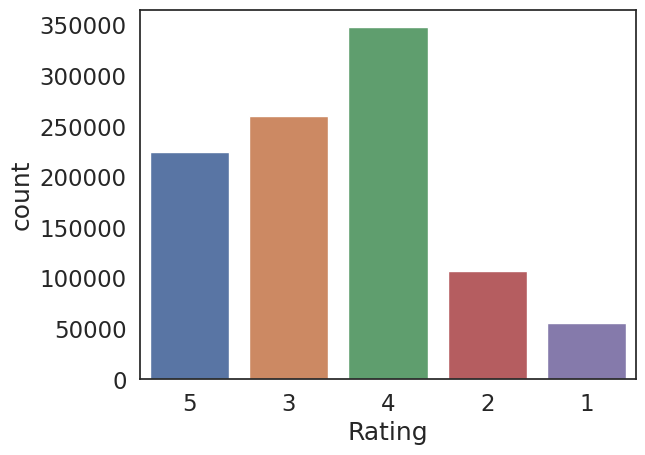

Release_Decade


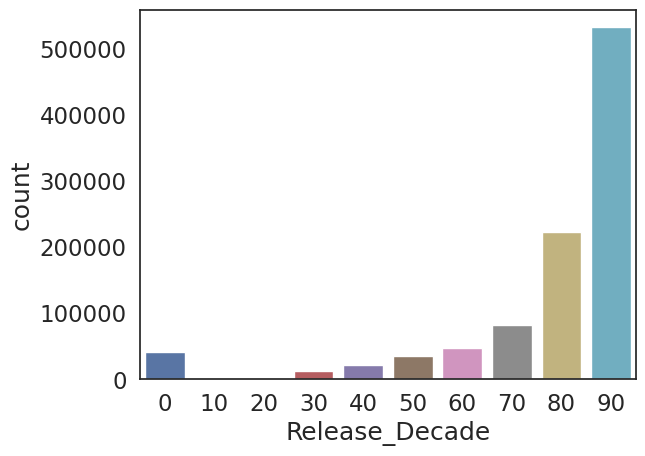

Gender


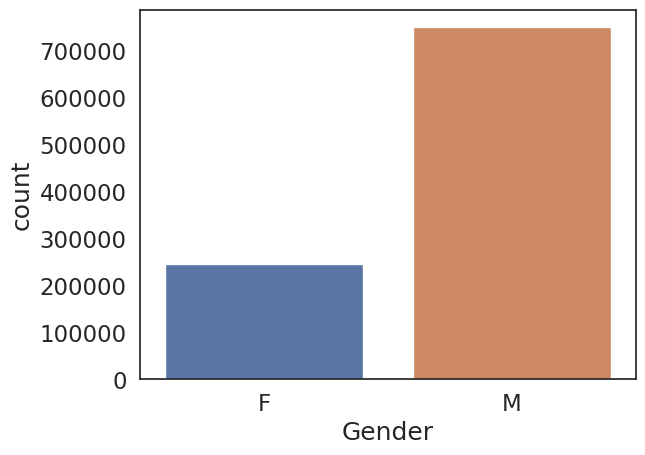

Age


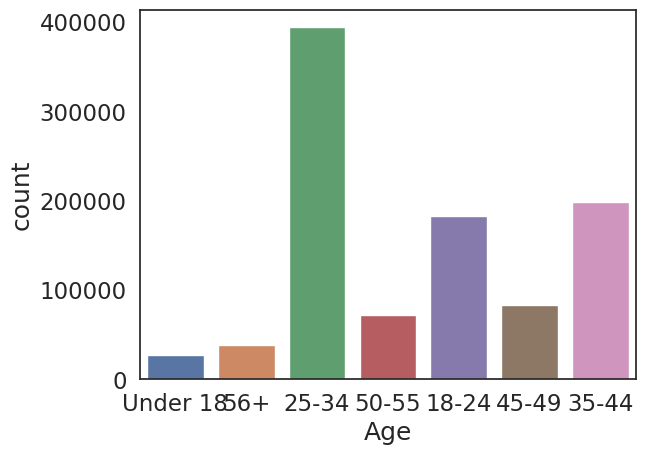

In [ ]:
for cat in cat_col:
  if (df[cat].nunique() <= 20):
    print(cat)
    sns.countplot(data = df , x = cat)
    plt.show()


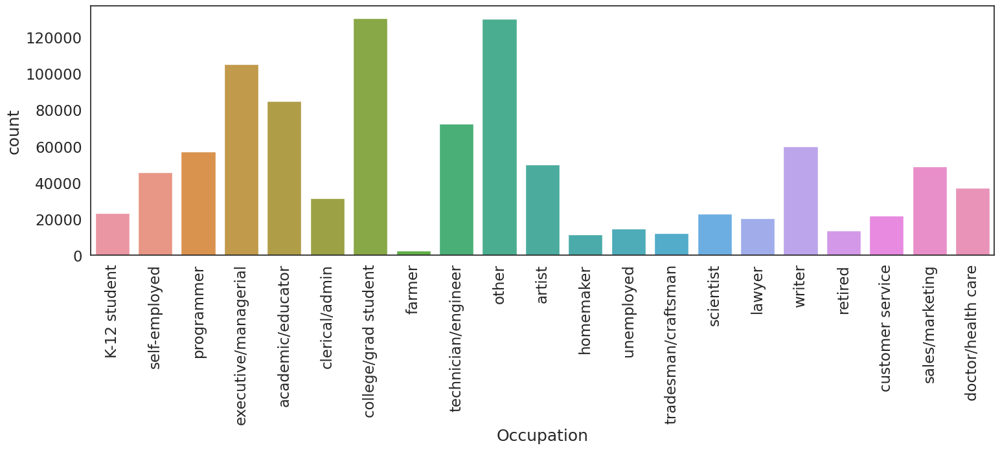

In [ ]:
plt.figure(figsize = (18,5))
sns.countplot(data = df , x = "Occupation")
plt.xticks(rotation = "vertical")
plt.show()

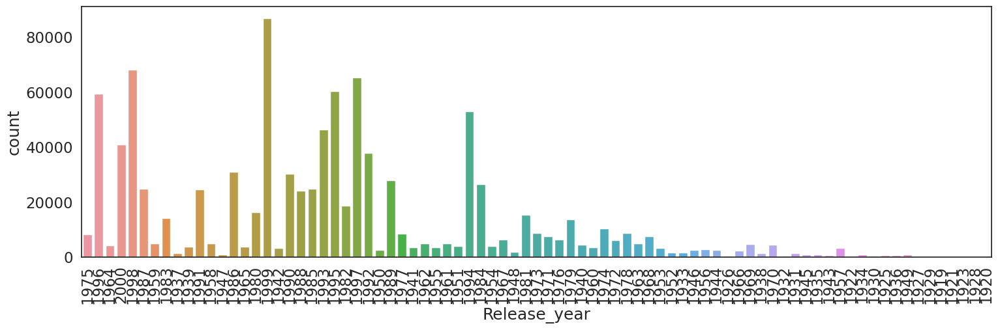

In [ ]:
plt.figure(figsize = (18,5))
sns.countplot(data = df , x = "Release_year")
plt.xticks(rotation = "vertical")
plt.show()

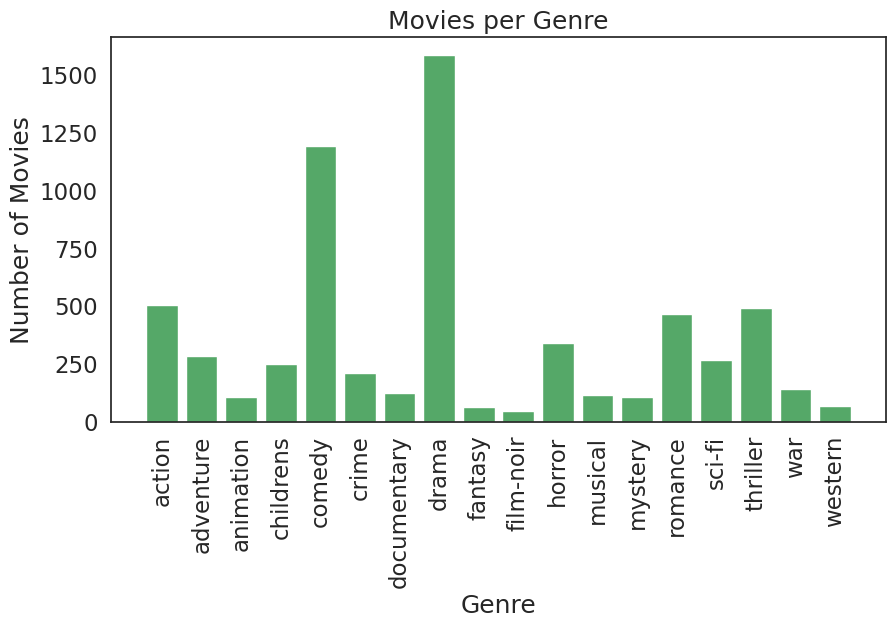

In [ ]:
genre_list=['action', 'adventure','animation', 'childrens', 'comedy', 'crime', 'documentary', 'drama','fantasy', 'film-noir', 'horror', 'musical', 'mystery', 'romance', 'sci-fi','thriller', 'war', 'western']
x = np.arange(18)
plt.figure(figsize = (10,5))
plt.bar(x, test2, color = 'g')
plt.xticks(x, genre_list, rotation = 'vertical')
plt.xlabel('Genre')
plt.ylabel('Number of Movies')
plt.title('Movies per Genre')
sns.set(font_scale=1.5)
plt.show()

Text(0, 0.5, 'User Rating count')

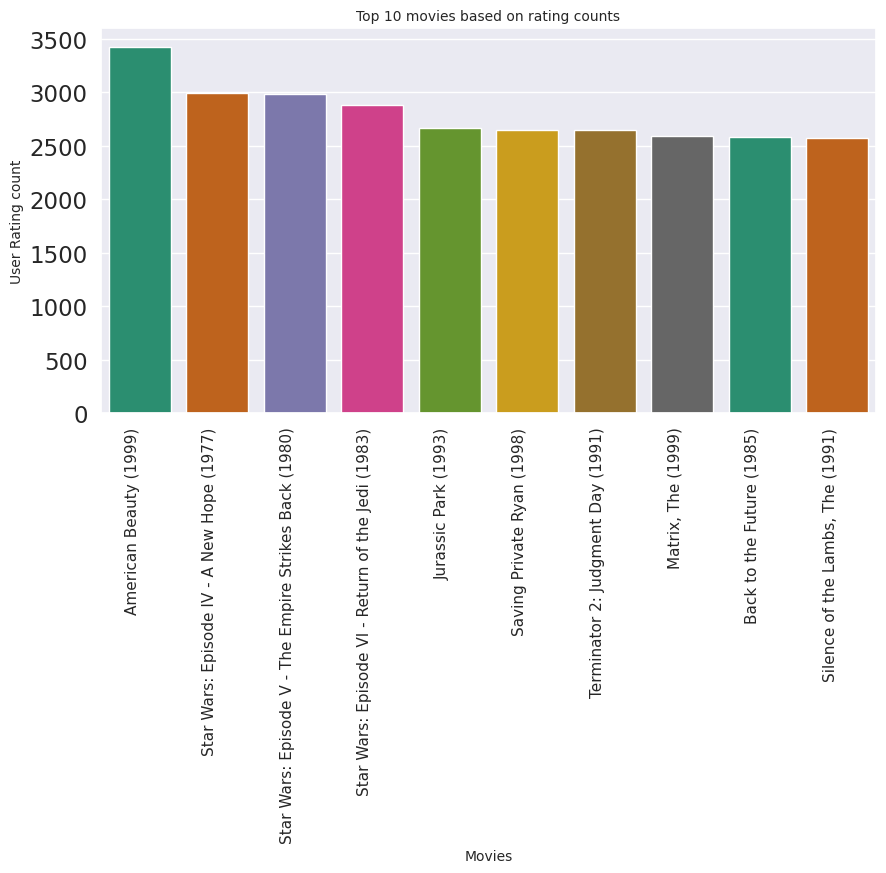

In [ ]:
movies_rating_count = df.groupby(by = ['Title'])['Rating'].count().reset_index()[['Title', 'Rating']] ## Counting the ratings based on movies
movies_rating_count.rename(columns = {'Rating': 'totalRatingCount'},inplace=True)

top10_movies=movies_rating_count[['Title', 'totalRatingCount']].sort_values(by = 'totalRatingCount',ascending = False).head(10)

plt.figure(figsize=(10,5))
ax=sns.barplot(x="Title", y="totalRatingCount", data=top10_movies, palette="Dark2")
ax.set_xticklabels(ax.get_xticklabels(), fontsize=11, rotation=90, ha="right")
ax.set_title('Top 10 movies based on rating counts',fontsize = 10)
ax.set_xlabel('Movies',fontsize = 10) 
ax.set_ylabel('User Rating count', fontsize = 10)

## **Bivariate Analysis**

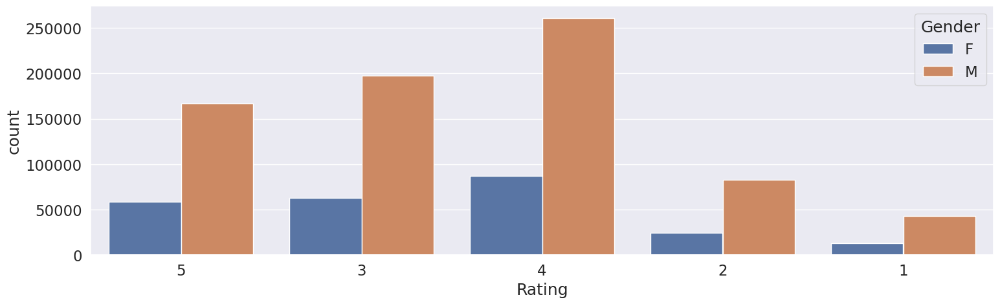

In [ ]:
plt.figure(figsize = (18,5))
sns.countplot(data = df , x = "Rating" , hue = "Gender" )
plt.show()

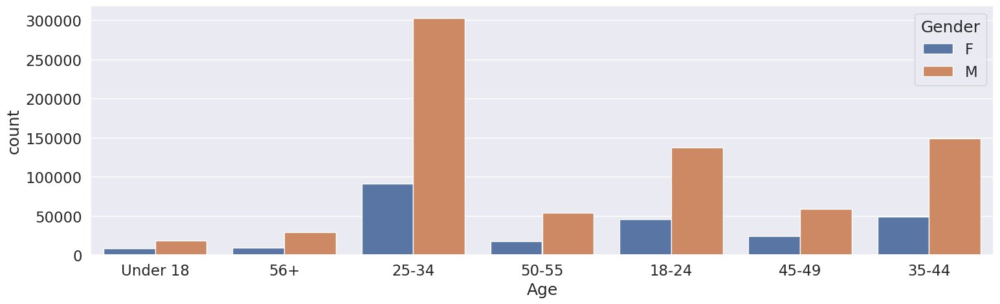

In [ ]:
plt.figure(figsize = (18,5))
sns.countplot(data = df , x = "Age" , hue = "Gender" )
plt.show()

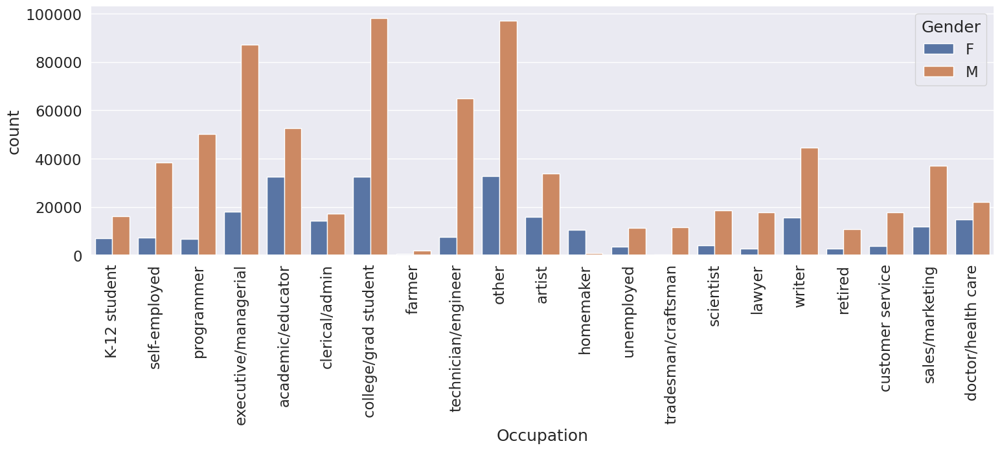

In [ ]:
plt.figure(figsize = (18,5))
sns.countplot(data = df , x = "Occupation" , hue = "Gender" )
plt.xticks(rotation = "vertical")
plt.show()

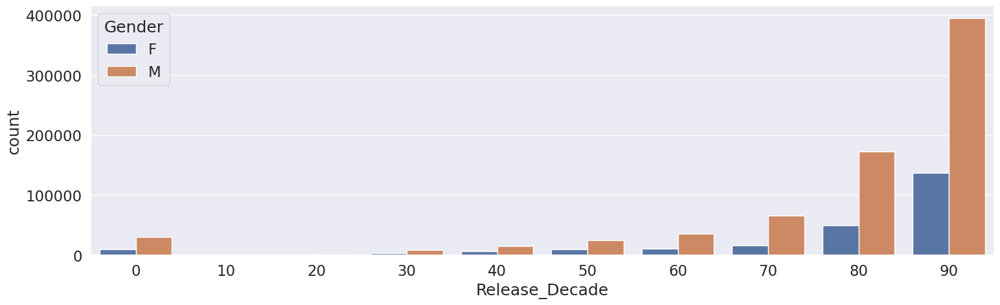

In [ ]:
plt.figure(figsize = (18,5))
sns.countplot(data = df , x = "Release_Decade" , hue = "Gender" )
plt.show()

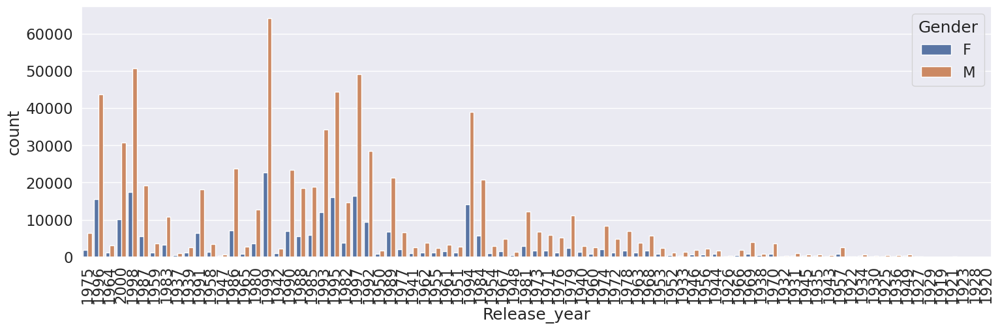

In [ ]:
plt.figure(figsize = (18,5))
sns.countplot(data = df , x = "Release_year" , hue = "Gender" )
plt.xticks(rotation = "vertical")
plt.show()

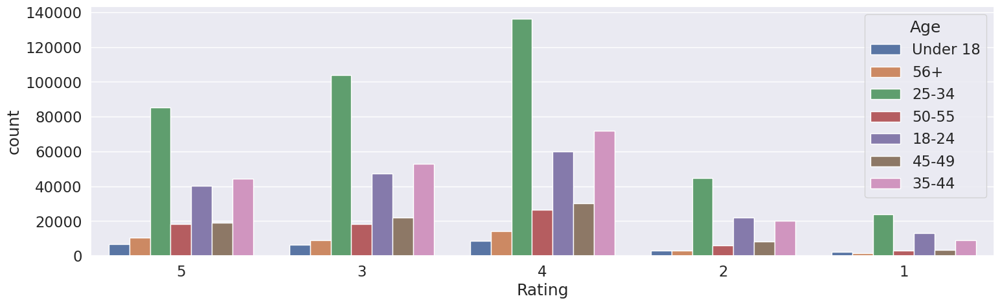

In [ ]:
plt.figure(figsize = (18,5))
sns.countplot(data = df , x = "Rating" , hue = "Age" )
plt.show()

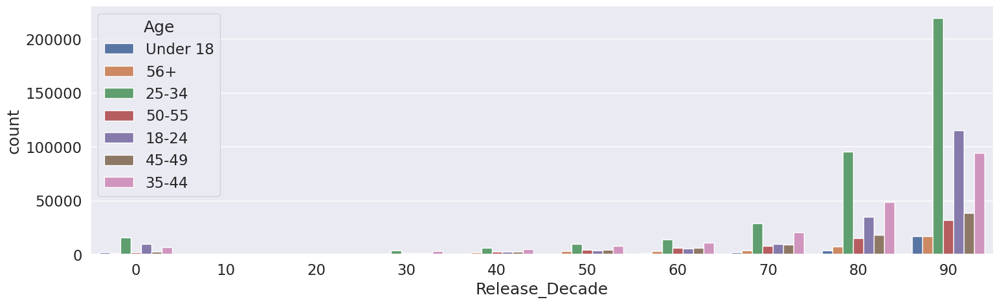

In [ ]:
plt.figure(figsize = (18,5))
sns.countplot(data = df , x = "Release_Decade" , hue = "Age" )
plt.show()

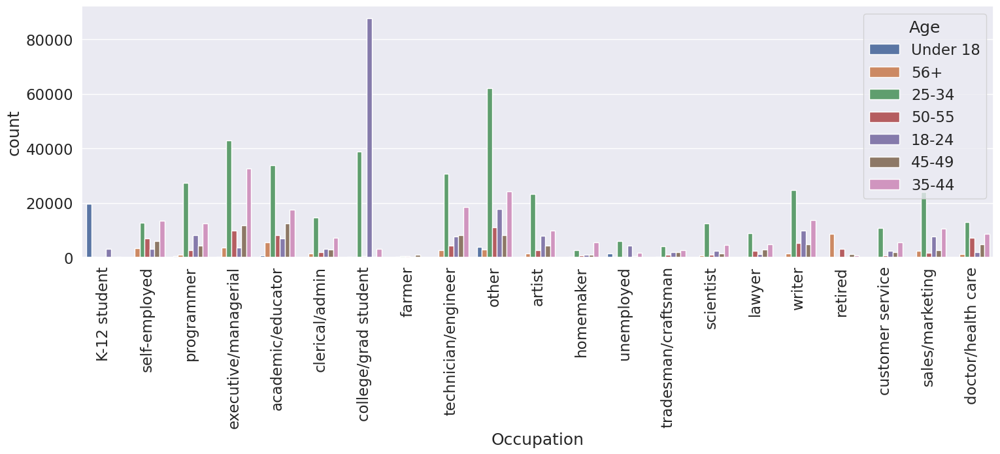

In [ ]:
plt.figure(figsize = (18,5))
sns.countplot(data = df , x = "Occupation" , hue = "Age" )
plt.xticks(rotation = "vertical")
plt.show()

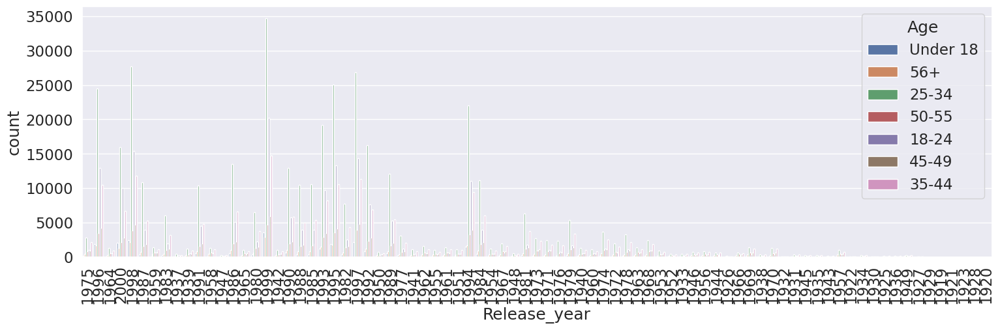

In [ ]:
plt.figure(figsize = (18,5))
sns.countplot(data = df , x = "Release_year" , hue = "Age" )
plt.xticks(rotation = "vertical")
plt.show()

## **Multivariate Analysis**

In [ ]:
df["Timestamp"] = pd.to_datetime(df['Timestamp'], unit='s')
df["Release_year"] = df["Release_year"].astype("int64")
df["Rating"] = df["Rating"].astype("int64")
df["Release_Decade"] = df["Release_Decade"].astype("int64")

In [ ]:
df.dtypes

UserID                    object
MovieID                   object
Rating                     int64
Timestamp         datetime64[ns]
Title                     object
Genres                    object
Release_year               int64
Release_Decade             int64
Gender                    object
Age                       object
Occupation                object
Zip-code                  object
dtype: object

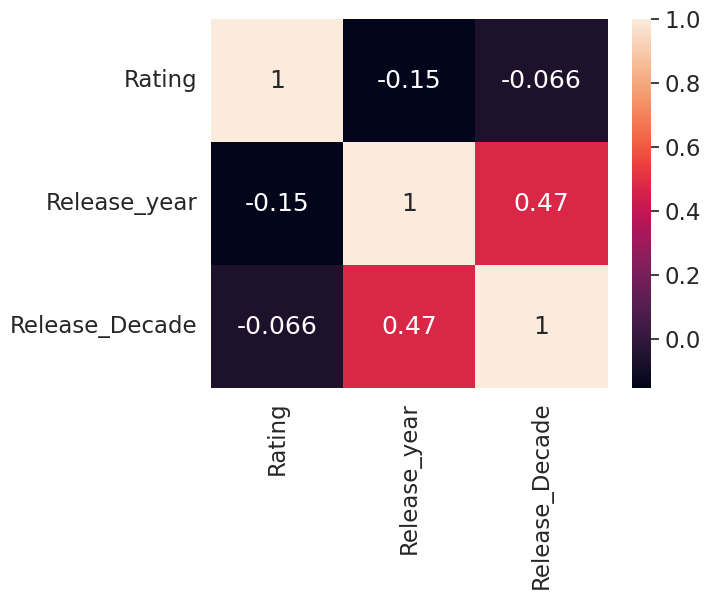

In [ ]:
sns.heatmap(data = df.corr() , annot=True)
plt.show()

# **movies preprocessing**

In [ ]:
dfmov = movies.copy()
dfmov.dropna(inplace=True)
dfmov.Genres = dfmov.Genres.str.split('|')
dfmov['Genres'] = dfmov['Genres'].apply(lambda x: [i for i in x if i!='A' and i!='D' and i!= 'F' and i!='C' and i!='M' and i!= 'W' and i!= ' '])
for i in dfmov['Genres']:
    for j in range(len(i)):
        if i[j] == 'Ro' or i[j] == 'Rom' or i[j] == 'Roman' or i[j] == 'R' or i[j] == 'Roma':
            i[j] = 'Romance'
        elif i[j] == 'Chil' or i[j] == 'Childre' or i[j] == 'Childr' or i[j] == "Children'" or i[j] =='Children' or i[j] =='Chi':
            i[j] = "Children's"
        elif i[j] == 'Fantas' or i[j] == 'Fant':
            i[j] = 'Fantasy'
        elif i[j] == 'Dr' or i[j] == 'Dram':
            i[j] = 'Drama'
        elif i[j] == 'Documenta'or i[j] == 'Docu' or i[j] == 'Document' or i[j] == 'Documen':
            i[j] = 'Documentary'
        elif i[j] == 'Wester'or i[j] == 'We':
            i[j] = 'Western'
        elif i[j] == 'Animati':
            i[j] = 'Animation'
        elif i[j] == 'Come'or i[j] == 'Comed' or i[j] == 'Com':
            i[j] = 'Comedy'
        elif i[j] == 'Sci-F'or i[j] == 'S' or i[j] == 'Sci-' or i[j] == 'Sci':
            i[j] = 'Sci-Fi'
        elif i[j] == 'Adv'or i[j] == 'Adventu' or i[j] == 'Adventur' or i[j] == 'Advent':
            i[j] = 'Adventure'
        elif i[j] == 'Horro'or i[j] == 'Horr':
            i[j] = 'Horror'
        elif i[j] == 'Th'or i[j] == 'Thri' or i[j] == 'Thrille':
            i[j] = 'Thriller'
        elif i[j] == 'Acti':
            i[j] = 'Action'
        elif i[j] == 'Wa':
            i[j] = 'War'
        elif i[j] == 'Music':
            i[j] = 'Musical'
dfmov.head()

,MovieID,Title,Genres,Release_year,Release_Decade
0,1,Toy Story (1995),"[Animation, Children's, Comedy]",1995,90
1,2,Jumanji (1995),"[Adventure, Children's, Fantasy]",1995,90
2,3,Grumpier Old Men (1995),"[Comedy, Romance]",1995,90
3,4,Waiting to Exhale (1995),"[Comedy, Drama]",1995,90
4,5,Father of the Bride Part II (1995),[Comedy],1995,90


In [ ]:
genres_df = pd.get_dummies(dfmov['Genres'].apply(pd.Series).stack()).sum(level=0)
genres_df.head()

,,Action,Adventure,Animation,Children's,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western
0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
test = genres_df.iloc[:,0:].sum()
test=test.iloc[1:]
print(test)

Action          501
Adventure       282
Animation       104
Children's      249
Comedy         1189
Crime           210
Documentary     124
Drama          1582
Fantasy          62
Film-Noir        44
Horror          340
Musical         113
Mystery         105
Romance         462
Sci-Fi          265
Thriller        488
War             139
Western          68
dtype: int64


In [ ]:
len(test)

18

In [ ]:
print(type(pd.to_numeric(test)))
print(type(test.to_numpy().reshape(18,)[0]))
# genre_sum = np.hstack((np.asarray(genre_list).reshape(18,1), test.to_numpy().reshape(18,)))
# genre_sum[:,1] = genre_sum[:,1].astype('int64')
test2 = test.to_numpy().reshape(18,)

<class 'pandas.core.series.Series'>
<class 'numpy.int64'>


In [ ]:
movies.isnull().sum()

MovieID           0
Title             0
Genres            0
Release_year      0
Release_Decade    0
dtype: int64

In [ ]:
df = ratings.merge(movies , on = "MovieID").merge(users , on = "UserID")

# **Recommendations systems**

## **User-Interaction Matrix**

In [ ]:
matrix = pd.pivot_table(df, index='UserID', columns='Title', values='Rating', aggfunc='mean')
matrix.fillna(0, inplace=True) # Imputing 'NaN' values with Zero rating 

print(matrix.shape)

matrix.head(10)

(6040, 3682)


Title   $1,000,000 Duck (1971)  'Night Mother (1986)  \
UserID                                                 
1                         0.00                  0.00   
10                        0.00                  0.00   
100                       0.00                  0.00   
1000                      0.00                  0.00   
1001                      0.00                  0.00   
1002                      0.00                  0.00   
1003                      0.00                  0.00   
1004                      0.00                  0.00   
1005                      0.00                  0.00   
1006                      0.00                  0.00   

Title   'Til There Was You (1997)  'burbs, The (1989)  \
UserID                                                  
1                            0.00                0.00   
10                           0.00                4.00   
100                          0.00                0.00   
1000                         0.00                0.00   
1001                         0.00                0.00   
1002                         0.00                0.00   
1003                         0.00                0.00   
1004                         0.00                0.00   
1005                         0.00                0.00   
1006                         0.00                0.00   

Title   ...And Justice for All (1979)  1-900 (1994)  \
UserID                                                
1                                0.00          0.00   
10                               0.00          0.00   
100                              0.00          0.00   
1000                             0.00          0.00   
1001                             0.00          0.00   
1002                             0.00          0.00   
1003                             0.00          0.00   
1004                             0.00          0.00   
1005                             0.00          0.00   
1006                             0.00          0.00   

Title   10 Things I Hate About You (1999)  101 Dalmatians (1961)  \
UserID                                                             
1                                    0.00                   0.00   
10                                   0.00                   0.00   
100                                  0.00                   0.00   
1000                                 0.00                   4.00   
1001                                 0.00                   0.00   
1002                                 0.00                   0.00   
1003                                 0.00                   0.00   
1004                                 0.00                   4.00   
1005                                 0.00                   0.00   
1006                                 0.00                   0.00   

Title   101 Dalmatians (1996)  12 Angry Men (1957)  13th Warrior, The (1999)  \
UserID                                                                         
1                        0.00                 0.00                      0.00   
10                       0.00                 3.00                      4.00   
100                      0.00                 0.00                      0.00   
1000                     0.00                 0.00                      0.00   
1001                     3.00                 0.00                      0.00   
1002                     0.00                 0.00                      0.00   
1003                     0.00                 0.00                      0.00   
1004                     4.00                 0.00                      0.00   
1005                     0.00                 0.00                      0.00   
1006                     0.00                 0.00                      0.00   

Title   187 (1997)  2 Days in the Valley (1996)  20 Dates (1998)  \
UserID                                                             
1             0.00                         0.00             0.00   

In [ ]:
n_users = df['UserID'].nunique()
n_movies = df['MovieID'].nunique()
sparsity = round(1.0 - df.shape[0] / float( n_users * n_movies), 3)
print('The sparsity level of dataset is ' +  str(sparsity * 100) + '%')

The sparsity level of dataset is 95.5%


##**Pearson Correlation**

### **Item - Based approach**

In [ ]:
df[df['Title']=='Jumanji (1995)']

,UserID,MovieID,Rating,Timestamp,Title,Genres,Release_year,Release_Decade,Gender,Age,Occupation,Zip-code
756,18,2,2,978152541,Jumanji (1995),Adventure|Children's|Fantasy,1995,90,F,18-24,clerical/admin,95825
2190,44,2,4,1004410663,Jumanji (1995),Adventure|Children's|Fantasy,1995,90,M,45-49,technician/engineer,98052
2559,48,2,3,978064964,Jumanji (1995),Adventure|Children's|Fantasy,1995,90,M,25-34,college/grad student,92107
3271,53,2,5,977981548,Jumanji (1995),Adventure|Children's|Fantasy,1995,90,M,25-34,other,96931
4554,62,2,4,977904756,Jumanji (1995),Adventure|Children's|Fantasy,1995,90,F,35-44,clerical/admin,98105
...,...,...,...,...,...,...,...,...,...,...,...,...
982698,4242,2,4,965312117,Jumanji (1995),Adventure|Children's|Fantasy,1995,90,M,50-55,executive/managerial,78704
983415,2152,2,3,974620151,Jumanji (1995),Adventure|Children's|Fantasy,1995,90,M,18-24,college/grad student,22807
987209,4020,2,3,965524602,Jumanji (1995),Adventure|Children's|Fantasy,1995,90,M,25-34,doctor/health care,77034
991126,6019,2,4,956761170,Jumanji (1995),Adventure|Children's|Fantasy,1995,90,M,25-34,other,10024


In [ ]:
movies_name = 'Jumanji (1995)'
movie_rating = matrix[movies_name] 
print(movie_rating)

UserID
1      0.00
10     5.00
100    0.00
1000   0.00
1001   0.00
       ... 
995    0.00
996    0.00
997    0.00
998    0.00
999    0.00
Name: Jumanji (1995), Length: 6040, dtype: float64


In [ ]:
sim_movies = matrix.corrwith(movie_rating) 

sim_df = pd.DataFrame(sim_movies, columns=['Cor-relation'])
sim_df.sort_values('Cor-relation', ascending=False, inplace=True) 
sim_df.iloc[1: , :].head(10) 

,Cor-relation
Title,
Hook (1991),0.52
Dragonheart (1996),0.45
"Indian in the Cupboard, The (1995)",0.44
"Santa Clause, The (1994)",0.42
"NeverEnding Story, The (1984)",0.41
"Honey, I Shrunk the Kids (1989)",0.40
Space Jam (1996),0.40
Teenage Mutant Ninja Turtles (1990),0.39
Willow (1988),0.39


### **User-Based Approach (optional)**

## **Cosine Similarty**

In [ ]:
item_similarity = cosine_similarity(matrix.T) 
item_similarity

array([[1.        , 0.07235746, 0.03701053, ..., 0.        , 0.12024178,
        0.02700277],
       [0.07235746, 1.        , 0.11528952, ..., 0.        , 0.        ,
        0.07780705],
       [0.03701053, 0.11528952, 1.        , ..., 0.        , 0.04752635,
        0.0632837 ],
       ...,
       [0.        , 0.        , 0.        , ..., 1.        , 0.        ,
        0.04564448],
       [0.12024178, 0.        , 0.04752635, ..., 0.        , 1.        ,
        0.04433508],
       [0.02700277, 0.07780705, 0.0632837 , ..., 0.04564448, 0.04433508,
        1.        ]])

In [ ]:
item_similarity.shape

(3682, 3682)

### **Item-Based Similarity**

In [ ]:
item_similarity_matrix = pd.DataFrame(item_similarity, index=matrix.columns, columns=matrix.columns)
item_similarity_matrix.head() 

Title                          $1,000,000 Duck (1971)  'Night Mother (1986)  \
Title                                                                         
$1,000,000 Duck (1971)                           1.00                  0.07   
'Night Mother (1986)                             0.07                  1.00   
'Til There Was You (1997)                        0.04                  0.12   
'burbs, The (1989)                               0.08                  0.12   
...And Justice for All (1979)                    0.06                  0.16   

Title                          'Til There Was You (1997)  'burbs, The (1989)  \
Title                                                                          
$1,000,000 Duck (1971)                              0.04                0.08   
'Night Mother (1986)                                0.12                0.12   
'Til There Was You (1997)                           1.00                0.10   
'burbs, The (1989)                                  0.10                1.00   
...And Justice for All (1979)                       0.07                0.14   

Title                          ...And Justice for All (1979)  1-900 (1994)  \
Title                                                                        
$1,000,000 Duck (1971)                                  0.06          0.00   
'Night Mother (1986)                                    0.16          0.00   
'Til There Was You (1997)                               0.07          0.08   
'burbs, The (1989)                                      0.14          0.00   
...And Justice for All (1979)                           1.00          0.00   

Title                          10 Things I Hate About You (1999)  \
Title                                                              
$1,000,000 Duck (1971)                                      0.06   
'Night Mother (1986)                                        0.08   
'Til There Was You (1997)                                   0.13   
'burbs, The (1989)                                          0.19   
...And Justice for All (1979)                               0.08   

Title                          101 Dalmatians (1961)  101 Dalmatians (1996)  \
Title                                                                         
$1,000,000 Duck (1971)                          0.19                   0.17   
'Night Mother (1986)                            0.15                   0.10   
'Til There Was You (1997)                       0.11                   0.13   
'burbs, The (1989)                              0.25                   0.18   
...And Justice for All (1979)                   0.19                   0.12   

Title                          12 Angry Men (1957)  13th Warrior, The (1999)  \
Title                                                                          
$1,000,000 Duck (1971)                        0.09                      0.06   
'Night Mother (1986)                          0.11                      0.05   
'Til There Was You (1997)                     0.08                      0.07   
'burbs, The (1989)                            0.17                      0.20   
...And Justice for All (1979)                 0.21                      0.12   

Title                          187 (1997)  2 Days in the Valley (1996)  \
Title                                                                    
$1,000,000 Duck (1971)               0.03                         0.02   
'Night Mother (1986)                 0.06                         0.11   
'Til There Was You (1997)            0.02                         0.07   
'burbs, The (1989)                   0.10                         0.18   
...And Justice for All (1979)        0.11                         0.20   

Title                          20 Dates (1998)  \
Title                                            
$1,000,000 Duck (1971)                    0.02   
'Night Mother (1986)                      0.04   
'Til There Was You (1997)  

### **User-Based Similarity**

In [ ]:
user_similarity = cosine_similarity(matrix) 
user_similarity

array([[1.        , 0.25586725, 0.12396703, ..., 0.15926709, 0.11935626,
        0.12205855],
       [0.25586725, 1.        , 0.25863269, ..., 0.16071024, 0.13280705,
        0.24681021],
       [0.12396703, 0.25863269, 1.        , ..., 0.20430203, 0.11352239,
        0.30610356],
       ...,
       [0.15926709, 0.16071024, 0.20430203, ..., 1.        , 0.18657496,
        0.18245166],
       [0.11935626, 0.13280705, 0.11352239, ..., 0.18657496, 1.        ,
        0.10797727],
       [0.12205855, 0.24681021, 0.30610356, ..., 0.18245166, 0.10797727,
        1.        ]])

In [ ]:
user_similarity_matrix = pd.DataFrame(user_similarity, index=matrix.index, columns=matrix.index)
user_similarity_matrix.head()

UserID    1   10  100  1000  1001  1002  1003  1004  1005  1006  1007  1008  \
UserID                                                                        
1      1.00 0.26 0.12  0.21  0.14  0.11  0.12  0.18  0.10  0.05  0.06  0.10   
10     0.26 1.00 0.26  0.28  0.16  0.11  0.14  0.43  0.19  0.10  0.16  0.22   
100    0.12 0.26 1.00  0.30  0.08  0.11  0.36  0.24  0.17  0.10  0.06  0.04   
1000   0.21 0.28 0.30  1.00  0.09  0.05  0.20  0.35  0.33  0.13  0.04  0.08   
1001   0.14 0.16 0.08  0.09  1.00  0.16  0.05  0.15  0.14  0.13  0.02  0.08   

UserID  1009  101  1010  1011  1012  1013  1014  1015  1016  1017  1018  1019  \
UserID                                                                          
1       0.05 0.03  0.16  0.08  0.08  0.05  0.20  0.18  0.13  0.14  0.18  0.11   
10      0.12 0.20  0.35  0.20  0.15  0.16  0.16  0.39  0.20  0.28  0.24  0.33   
100     0.06 0.35  0.26  0.14  0.09  0.02  0.30  0.19  0.17  0.14  0.34  0.19   
1000    0.12 0.28  0.25  0.12  0.12  0.05  0.18  0.22  0.09  0.20  0.36  0.20   
1001    0.20 0.07  0.25  0.07  0.04  0.07  0.06  0.30  0.29  0.10  0.07  0.17   

UserID  102  1020  1021  1022  1023  1024  1025  1026  1027  1028  1029  103  \
UserID                                                                         
1      0.12  0.03  0.09  0.11  0.10  0.02  0.03  0.00  0.14  0.05  0.19 0.03   
10     0.16  0.11  0.19  0.11  0.13  0.14  0.08  0.04  0.15  0.08  0.30 0.15   
100    0.01  0.18  0.20  0.07  0.09  0.07  0.07  0.03  0.21  0.10  0.15 0.22   
1000   0.10  0.14  0.17  0.06  0.04  0.02  0.12  0.03  0.15  0.07  0.22 0.17   
1001   0.18  0.15  0.10  0.27  0.05  0.07  0.12  0.13  0.08  0.05  0.16 0.10   

UserID  1030  1031  1032  1033  1034  1035  1036  1037  1038  1039  104  1040  \
UserID                                                                          
1       0.05  0.06  0.18  0.03  0.19  0.14  0.14  0.02  0.18  0.03 0.05  0.17   
10      0.24  0.27  0.23  0.20  0.33  0.12  0.17  0.05  0.18  0.05 0.08  0.33   
100     0.40  0.39  0.09  0.14  0.16  0.22  0.19  0.05  0.13  0.00 0.03  0.23   
1000    0.34  0.32  0.14  0.13  0.23  0.13  0.13  0.06  0.09  0.00 0.07  0.23   
1001    0.09  0.08  0.23  0.10  0.14  0.10  0.08  0.20  0.16  0.08 0.13  0.13   

UserID  1041  1042  1043  1044  1045  1046  1047  1048  1049  105  1050  1051  \
UserID                                                                          
1       0.05  0.08  0.08  0.15  0.06  0.03  0.14  0.15  0.07 0.10  0.14  0.25   
10      0.07  0.24  0.10  0.23  0.10  0.13  0.26  0.10  0.11 0.15  0.27  0.46   
100     0.08  0.05  0.09  0.19  0.00  0.09  0.26  0.14  0.18 0.26  0.16  0.21   
1000    0.04  0.05  0.06  0.26  0.04  0.09  0.20  0.05  0.09 0.45  0.13  0.24   
1001    0.08  0.02  0.06  0.02  0.14  0.05  0.14  0.19  0.14 0.05  0.37  0.31   

UserID  1052  1053  1054  1055  1056  1057  1058  1059  106  1060  1061  1062  \
UserID                                                                          
1       0.06  0.05  0.05  0.14  0.06  0.21  0.12  0.21 0.05  0.00  0.18  0.15   
10      0.14  0.19  0.22  0.19  0.14  0.29  0.34  0.34 0.17  0.10  0.16  0.29   
100     0.05  0.27  0.11  0.05  0.04  0.24  0.32  0.21 0.09  0.11  0.05  0.07   
1000    0.02  0.33  0.14  0.11  0.16  0.29  0.28  0.21 0.06  0.10  0.20  0.20   
1001    0.05  0.14  0.13  0.17  0.04  0.17  0.25  0.24 0.07  0.13  0.08  0.12   

UserID  1063  1064  1065  1066  1067  1068  1069  107  1070  1071  1072  1073  \
UserID                                                                          
1       0.10  0.12  0.03  0.10  0.12  0.24  0.03 0.12  0.04  0.07  0.23  0.07   
10      0.25  0.20  0.13  0.28  0.19  0.40  0.11 0.19  0.02  0.19  0.24  0.17   
100     0.26  0.17  0.03  0.20  0.18  0.19  0.10 0.17  0.13  0.18  0.17  0.13   
1000    0.30  0.15  0.01  0.14  0.11  0.18  0.04 0.13  0.04  0.11  0.17  0.09   
1001    0.14  0.24  0.21  0.13  0.16  0.22  0.28 0.04  0.08  0.12  0.15  0.11   

UserID  1074  1075  1076  1077  1078  1079  1

## **Matrix Factorization**

In [ ]:
rating_movie = df.pivot(index = 'UserID', columns ='MovieID', values = 'Rating').fillna(0)
rating_movie.head()

MovieID  1 10 100 1000 1002 1003 1004 1005 1006 1007 1008 1009 101 1010 1011  \
UserID                                                                         
1        5  0   0    0    0    0    0    0    0    0    0    0   0    0    0   
10       5  0   0    0    0    0    0    0    0    0    0    5   0    0    0   
100      0  0   0    0    0    0    0    0    0    0    0    0   0    0    0   
1000     5  0   0    0    0    0    0    0    0    0    0    0   0    0    0   
1001     4  0   0    0    0    0    0    0    0    0    0    0   0    0    0   

MovieID 1012 1013 1014 1015 1016 1017 1018 1019 102 1020 1021 1022 1023 1024  \
UserID                                                                         
1          0    0    0    0    0    0    0    0   0    0    0    5    0    0   
10         3    0    0    3    5    0    0    4   0    3    0    5    5    0   
100        0    0    0    0    0    0    0    0   0    0    0    0    0    0   
1000       0    0    0    0    0    0    0    0   0    0    0    0    5    0   
1001       0    0    0    0    0    0    0    0   0    0    0    0    0    0   

MovieID 1025 1026 1027 1028 1029 103 1030 1031 1032 1033 1034 1035 1036 1037  \
UserID                                                                         
1          0    0    0    5    5   0    0    0    0    0    0    5    0    0   
10         4    0    0    5    0   0    3    4    4    0    0    5    0    0   
100        0    0    0    0    0   0    0    0    0    0    0    0    0    0   
1000       0    0    0    0    3   0    0    0    0    0    0    0    4    0   
1001       0    0    0    0    0   0    0    0    0    0    0    0    0    0   

MovieID 1038 1039 104 1040 1041 1042 1043 1044 1046 1047 1049 105 1050 1051  \
UserID                                                                        
1          0    0   0    0    0    0    0    0    0    0    0   0    0    0   
10         0    0   3    0    0    5    0    0    0    0    0   0    0    0   
100        0    0   0    0    0    0    0    0    0    0    2   0    0    0   
1000       0    0   0    0    0    0    0    0    0    0    0   0    0    0   
1001       0    0   0    0    0    0    0    0    0    0    0   0    0    0   

MovieID 1053 1054 1055 1056 1057 1058 1059 106 1060 1061 1062 1063 1064 1066  \
UserID                                                                         
1          0    0    0    0    0    0    0   0    0    0    0    0    0    0   
10         0    0    0    0    0    0    5   0    0    0    0    0    0    0   
100        0    0    0    0    0    0    0   0    0    0    0    0    0    0   
1000       0    0    0    0    0    0    0   0    0    0    0    0    0    0   
1001       0    0    0    0    0    0    2   0    0    0    0    2    0    0   

MovieID 1067 1068 1069 107 1070 1071 1073 1076 1077 1078 1079 108 1080 1081  \
UserID                                                                        
1          0    0    0   0    0    0    0    0    0    0    0   0    0    0   
10         0    0    0   0    0    0    5    0    0    0    5   0    5    0   
100        0    0    0   0    0    0    0    0    0    0    0   0    0    0   
1000       0    0    0   0    0    0    0    0    0    0    0   0    0    0   
1001       0    0    0   0    0    0    0    0    0    0    0   0    0    0   

MovieID 1082 1083 1084 1085 1086 1087 1088 1089 1090 1091 1092 1093 1094 1095  \
UserID                                                                          
1          0    0    0    0    0    0    0    0    0    0    0    0    0    0   
10         0    0    4    0    0    0    5    0    0    3    0    0    0    0   
100        0    0    0    0    0    0    0    0    0    0    0    0    0    0   
1000       0    0    0    0    0    0    0    0    0    0    0    0    0    0   
1001       0    0    0    0    0    0    0    0    0    0    0    0    4    0   

MovieID 1096 1097 1098 1099 11 110 1100 1101 1102 1103 1104 1105 1107 111  \
Use

###  **Using CMFrec Library**

In [ ]:
user_item = df[['UserID', 'MovieID', 'Rating']].copy()
user_item.head(2)

,UserID,MovieID,Rating
0,1,1193,5
1,1,661,3


In [ ]:
user_item.columns = ['UserId', 'ItemId', 'Rating']

In [ ]:
print(user_item.shape)
print("No.of Users:",len(user_item['UserId'].unique()))
print("No.of Items:",len(user_item['ItemId'].unique()))

(996144, 3)
No.of Users: 6040
No.of Items: 3682


In [ ]:
model = CMF(method="als", k=4, lambda_=0.1, user_bias=False, item_bias=False, verbose=False) 

In [ ]:
model.fit(user_item)

Collective matrix factorization model
(explicit-feedback variant)


In [ ]:
model.A_.shape

(6040, 4)

In [ ]:
model.B_.shape 

(3682, 4)

In [ ]:
user_item['Rating'].mean()

inf

In [ ]:
model.glob_mean_ 

3.5799853801727295

In [ ]:
rm_ = np.dot(model.A_, model.B_.T) + model.glob_mean_ 
rm_

array([[4.071759 , 3.9887626, 4.212109 , ..., 3.5891392, 3.6877332,
        3.6423757],
       [4.197236 , 2.89865  , 4.7196636, ..., 3.213134 , 3.2731235,
        4.4341993],
       [4.3977017, 2.7349327, 3.0865376, ..., 3.5052555, 3.4593997,
        2.6599696],
       ...,
       [4.6076965, 3.8624053, 3.9517734, ..., 3.5411384, 3.193017 ,
        4.4374933],
       [3.9298916, 2.8622146, 3.373194 , ..., 3.4208252, 3.2185535,
        3.8349206],
       [3.728297 , 2.4288392, 3.4093533, ..., 3.3720067, 3.5106719,
        2.9479032]], dtype=float32)

In [ ]:
top_items = model.topN(user=100, n=10)           # Acoording to matrix factorization recommendation user no. 100 getting these top 10 movies get recommended.
movies.loc[movies.MovieID.isin(top_items)]

,MovieID,Title,Genres,Release_year,Release_Decade
36,37,Across the Sea of Time (1995),Documentary,1995,90
108,110,Braveheart (1995),Action|Drama|War,1995,90
352,356,Forrest Gump (1994),Comedy|Romance|War,1994,90
724,733,"Rock, The (1996)",Action|Adventure|Thriller,1996,90
770,780,Independence Day (ID4) (1996),Action|Sci-Fi|War,1996,90
801,811,"Bewegte Mann, Der (1994)",Comedy,1994,90
1023,1036,Die Hard (1988),Action|Thriller,1988,80
3078,3147,"Green Mile, The (1999)",Drama|Thriller,1999,90
3509,3578,Gladiator (2000),Action|Drama,2000,0
3684,3753,"Patriot, The (2000)",Action|Drama|War,2000,0


In [ ]:
rmse = mse(rating_movie.values[rating_movie > 0], rm_[rating_movie > 0], squared=False) 
print('Root Mean Squared Error: {:.3f}'.format(rmse)) 

In [ ]:
mape_ =  mape(rating_movie.values[rating_movie > 0], rm_[rating_movie > 0]) 
print('Mean Absolute Percentage Error: {:.3f}'.format(mape_))

### **Embeddings for user-user similarity.**

In [ ]:
user = cosine_similarity(model.A_)

user_similarity_matrix = pd.DataFrame(user, index=matrix.index, columns=matrix.index)
user_similarity_matrix.head()

UserID     1    10   100  1000  1001  1002  1003  1004  1005  1006  1007  \
UserID                                                                     
1       1.00 -0.13 -0.09 -0.37  0.69  0.39 -0.02  0.25 -0.51 -0.18  0.12   
10     -0.13  1.00  0.17  0.79  0.06  0.62  0.45  0.40  0.58  0.51  0.25   
100    -0.09  0.17  1.00  0.65  0.18  0.25  0.95  0.22  0.16  0.93  0.34   
1000   -0.37  0.79  0.65  1.00 -0.17  0.33  0.80  0.14  0.45  0.88  0.12   
1001    0.69  0.06  0.18 -0.17  1.00  0.81  0.25  0.85  0.19  0.10  0.80   

UserID  1008  1009   101  1010  1011  1012  1013  1014  1015  1016  1017  \
UserID                                                                     
1       0.28  0.05 -0.51 -0.46  0.16  0.76 -0.14  0.50 -0.58 -0.33  0.18   
10      0.37  0.98  0.69  0.77  0.44 -0.26  0.29 -0.17  0.83  0.69  0.92   
100     0.88  0.10 -0.19  0.66 -0.03 -0.09  0.47  0.43 -0.03 -0.06  0.35   
1000    0.67  0.68  0.39  0.94  0.06 -0.53  0.29 -0.16  0.64  0.38  0.73   
1001    0.35  0.24 -0.02 -0.00  0.74  0.92  0.61  0.91 -0.19  0.27  0.40   

UserID  1018  1019   102  1020  1021  1022  1023  1024  1025  1026  1027  \
UserID                                                                     
1      -0.40 -0.01 -0.15 -0.22 -0.50 -0.37 -0.52  0.05 -0.10  0.80 -0.73   
10      0.45  0.92  0.97  0.93  0.91  0.38  0.88  0.13  0.65 -0.35  0.28   
100     0.45 -0.10  0.13  0.48  0.29  0.93  0.12  0.98  0.84  0.42  0.68   
1000    0.47  0.52  0.80  0.89  0.86  0.85  0.73  0.61  0.86 -0.19  0.65   
1001    0.37  0.25 -0.14  0.17 -0.12 -0.11 -0.09  0.19  0.31  0.58 -0.14   

UserID  1028  1029   103  1030  1031  1032  1033  1034  1035  1036  1037  \
UserID                                                                     
1      -0.17 -0.74 -0.72  0.28 -0.07  0.45  0.37 -0.28  0.30  0.01  0.10   
10      0.81  0.32 -0.10  0.25  0.80  0.58  0.01  0.88 -0.00  0.51  0.23   
100     0.68  0.17 -0.28  0.74  0.35 -0.07  0.55  0.08  0.21  0.88 -0.17   
1000    0.90  0.35 -0.16  0.37  0.62  0.12  0.05  0.60 -0.16  0.85 -0.15   
1001    0.25 -0.04 -0.21  0.77  0.50  0.78  0.88  0.22  0.88  0.09  0.69   

UserID  1038  1039   104  1040  1041  1042  1043  1044  1045  1046  1047  \
UserID                                                                     
1      -0.00 -0.29 -0.25 -0.28 -0.30  0.62 -0.22 -0.07 -0.28 -0.38 -0.38   
10      0.98  0.33  0.46  0.40  0.35 -0.11  0.01  0.70  0.09  0.14  0.79   
100     0.08  0.67  0.76  0.96  0.69 -0.17  0.76  0.82  0.93  0.77  0.68   
1000    0.73  0.49  0.65  0.81  0.53 -0.47  0.32  0.92  0.66  0.47  0.96   
1001    0.03  0.44  0.41  0.10  0.42  0.92  0.44  0.16 -0.17  0.28  0.02   

UserID  1048  1049   105  1050  1051  1052  1053  1054  1055  1056  1057  \
UserID                                                                     
1      -0.51 -0.54 -0.43  0.86  0.72 -0.04 -0.29 -0.75 -0.73  0.31  0.13   
10      0.83  0.35  0.22  0.26  0.34  0.08  0.76  0.23  0.66  0.23  0.23   
100     0.49  0.24  0.90  0.19  0.06 -0.06  0.73  0.21  0.38  0.05  0.39   
1000    0.89  0.32  0.66  0.01 -0.03 -0.17  0.99  0.31  0.75 -0.08  0.14   
1001   -0.02  0.23  0.09  0.88  0.94  0.64 -0.06 -0.04 -0.16  0.88  0.81   

UserID  1058  1059  106  1060  1061  1062  1063  1064  1065  1066  1067  1068  \
UserID                                                                          
1      -0.58 -0.05 0.41  0.68  0.19 -0.04  0.42 -0.29  0.70  0.28 -0.36 -0.51   
10      0.87  0.76 0.73  0.29  0.14 -0.22  0.11  0.38  0.25  0.21  0.71  0.37   
100     0.32 -0.17 0.26 -0.24  0.95  0.68  0.17  0.42 -0.38 -0.07 -0.24 -0.37   
1000    0.90  0.32 0.44 -0.21  0.51  0.08 -0.12  0.36 -0.30 -0.16  0.33  0.04   
1001   -0.28  0.40 0.72  0.86  0.47  0.53  0.94  0.49  0.78  0.83  0.12  0.03   

UserID  1069   107  1070  1071  1072  1073  1074  1075  1076  1077  1078  \
UserID                                                                     
1       0.09 -0.31  0.18  0.49  0.42  0.39  0.48 -0.30  0.70 -0.33 -0.31   
10    

In [ ]:
item = cosine_similarity(model.B_)

item_similarity_matrix = pd.DataFrame(item, index=user_item['ItemId'].unique(), columns=user_item['ItemId'].unique())
item_similarity_matrix.head()

1193  661  914  3408  2355  1197  1287  2804  594  919  595   938  2398  \
1193  1.00 0.35 0.65  0.46  0.76  0.95  0.81  0.97 0.61 0.89 0.53 -0.06  0.63   
661   0.35 1.00 0.49  0.32  0.51  0.25  0.21  0.31 0.66 0.45 0.44  0.60  0.45   
914   0.65 0.49 1.00  0.91  0.88  0.74  0.76  0.71 0.98 0.92 0.96  0.66  0.98   
3408  0.46 0.32 0.91  1.00  0.88  0.66  0.81  0.61 0.87 0.78 0.98  0.60  0.96   
2355  0.76 0.51 0.88  0.88  1.00  0.88  0.93  0.87 0.88 0.92 0.91  0.38  0.93   

      2918  1035  2791  2687  2018  3105  2797  2321  720  1270  527  2340  \
1193  0.87  0.35  0.82  0.25  0.54  0.56  0.64  0.69 0.97  0.67 0.94 -0.37   
661   0.25  0.41  0.31  0.45  0.69  0.50  0.43  0.74 0.40  0.15 0.20  0.32   
914   0.58  0.94  0.32  0.83  0.96  0.95  0.90  0.86 0.76  0.71 0.79  0.29   
3408  0.60  0.92  0.31  0.95  0.88  0.98  0.96  0.82 0.52  0.85 0.68  0.57   
2355  0.86  0.74  0.69  0.80  0.86  0.94  0.98  0.96 0.76  0.91 0.85  0.31   

        48  1097  1721  1545  745  2294  3186  1566  588  1907   783  1836  \
1193 -0.57  0.70 -0.01  0.45 0.98  0.25  0.11 -0.14 0.53  0.27 -0.24 -0.06   
661   0.28  0.36  0.12  0.80 0.35  0.75  0.68  0.44 0.41  0.31  0.57  0.85   
914   0.18  0.93  0.61  0.66 0.73  0.62  0.72  0.47 0.90  0.82  0.49  0.02   
3408  0.39  0.95  0.87  0.34 0.51  0.74  0.80  0.71 0.99  0.98  0.59 -0.17   
2355  0.06  0.97  0.61  0.43 0.76  0.76  0.68  0.52 0.94  0.80  0.36 -0.00   

      1022  2762  150    1  1961  1962  2692  260  1028  1029  1207  2028  \
1193  0.39  0.85 0.65 0.86  0.81  0.54  0.95 0.90  0.48  0.49  0.94  0.86   
661   0.55  0.08 0.20 0.32  0.36  0.55  0.49 0.07  0.49  0.74  0.41  0.09   
914   0.94  0.70 0.85 0.87  0.88  0.98  0.48 0.60  0.98  0.92  0.84  0.65   
3408  0.94  0.72 0.94 0.84  0.88  0.95  0.27 0.59  0.95  0.86  0.63  0.68   
2355  0.81  0.87 0.93 0.96  0.98  0.89  0.67 0.81  0.85  0.85  0.82  0.85   

      531  3114  608  1246  1357  3068  1537  647  2194   648  2268  2628  \
1193 0.41  0.90 0.94  0.74  0.76  0.84  0.90 0.26  0.82 -0.10  0.50 -0.19   
661  0.77  0.32 0.51  0.39  0.76  0.67  0.61 0.46  0.30  0.17  0.12 -0.03   
914  0.89  0.84 0.46  0.93  0.85  0.85  0.85 0.71  0.73  0.27  0.73  0.18   
3408 0.78  0.78 0.21  0.94  0.76  0.76  0.62 0.90  0.78  0.62  0.92  0.57   
2355 0.74  0.94 0.62  0.98  0.94  0.96  0.83 0.82  0.95  0.50  0.87  0.40   

      1103  2916  3468  1210  1792  1687  1213  3578  2881  3030  1217   434  \
1193  0.85  0.37  0.99  0.67 -0.48 -0.62  0.91  0.64 -0.50  0.93  0.83 -0.55   
661   0.75  0.24  0.45  0.08  0.07 -0.02  0.26 -0.02  0.04  0.50  0.63  0.00   
914   0.83  0.34  0.70  0.56  0.04 -0.13  0.32  0.51  0.12  0.71  0.40 -0.09   
3408  0.63  0.60  0.53  0.71  0.41  0.25  0.21  0.68  0.47  0.41  0.09  0.29   
2355  0.86  0.72  0.83  0.84  0.17 -0.01  0.61  0.79  0.17  0.68  0.49  0.06   

      2126  3107  3108  3035  1253  1610   292  2236  3071  902   368  1259  \
1193 -0.69 -0.15  0.62  0.91  0.96  0.66 -0.33  0.11  0.62 0.78 -0.06  0.90   
661   0.16  0.07  0.91  0.43  0.44  0.14  0.11  0.34  0.56 0.68  0.12  0.38   
914  -0.19  0.28  0.45  0.85  0.79  0.73  0.20  0.76  0.94 0.94  0.29  0.79   
3408  0.11  0.65  0.29  0.77  0.68  0.86  0.56  0.93  0.95 0.75  0.65  0.76   
2355 -0.11  0.47  0.63  0.96  0.92  0.91  0.33  0.69  0.97 0.88  0.52  0.96   

      3147  1544  1293  1188  3255  3256  3257  110  2278  2490  1834  3471  \
1193  0.61 -0.54  0.86  0.50  0.34  0.29 -0.63 0.71  0.33 -0.00  0.87  0.91   
661   0.09  0.06  0.62  0.83  0.39  0.18  0.08 0.01  0.52  0.26  0.76  0.47   
914   0.68 -0.02  0.92  0.77  0.84  0.60  0.06 0.55  0.16  0.03  0.73  0.76   
3408  0.85  0.35  0.72  0.50  0.98  0.87  0.37 0.68  0.32  0.35  0.50  0.71   
2355  0.88  0.10  0.88  0.58  0.86  0.79  0.02 0.81  0.58  0.42  0.79  0.95   

      589  1690  3654  2852  1945  982  1873  2858  1225  515   442  2312  \
1193 0.71 -0.60  0.79  0.67  0.95 0.37  0.37  0.96  0.96 0.56 -0.57  0.64   
661  0.11  0.17  0.38  0.62  0.58 0.88  0.44  0.37  0.49 0.89  0.08  0

In [ ]:
movie_name='594'
movie_rating = item_similarity_matrix[movie_name]
print(movie_rating)

1193    0.61
661     0.66
914     0.98
3408    0.87
2355    0.88
        ... 
3280   -0.86
3647   -0.37
402    -0.35
872    -0.08
684     0.74
Name: 594, Length: 3682, dtype: float32


In [ ]:
similar_movies = item_similarity_matrix.corrwith(movie_rating) 

similar_df = pd.DataFrame(similar_movies, columns=['Cor-relation'])
similar_df.sort_values('Cor-relation', ascending=False, inplace=True) 

similar_df.iloc[1: , :].head() 

,Cor-relation
3668,1.00
2137,1.00
596,1.00
897,1.00
915,1.00


In [ ]:
item_movie = df[['MovieID', 'Title']].copy()
item_movie.drop_duplicates(inplace=True)
item_movie.reset_index(drop=True,inplace=True)

In [ ]:
similar_df1= similar_df.copy()
similar_df1.reset_index(inplace=True)
similar_df1.rename(columns = {'index':'MovieID'}, inplace = True)
similar_mov = pd.merge(similar_df1,item_movie,on='MovieID',how='inner')
similar_mov.head(6)

,MovieID,Cor-relation,Title
0,594,1.00,Snow White and the Seven Dwarfs (1937)
1,3668,1.00,Romeo and Juliet (1968)
2,2137,1.00,Charlotte's Web (1973)
3,596,1.00,Pinocchio (1940)
4,897,1.00,For Whom the Bell Tolls (1943)
5,915,1.00,Sabrina (1954)


In [ ]:
model1 = CMF(method="als", k=2, lambda_=0.1, user_bias=False, item_bias=False, verbose=False)
model1.fit(user_item)

Collective matrix factorization model
(explicit-feedback variant)


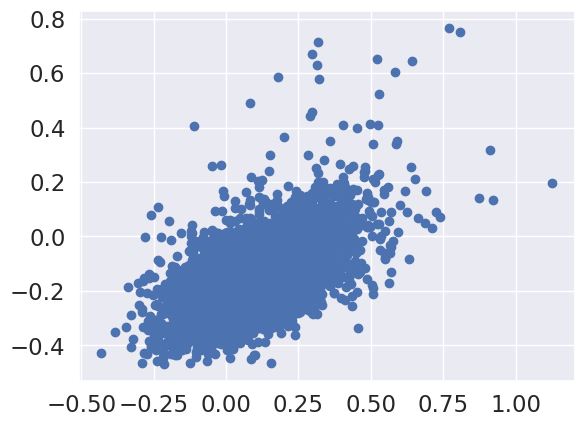

In [ ]:
plt.scatter(model1.A_[:, 0], model1.A_[:, 1], cmap = 'hot')

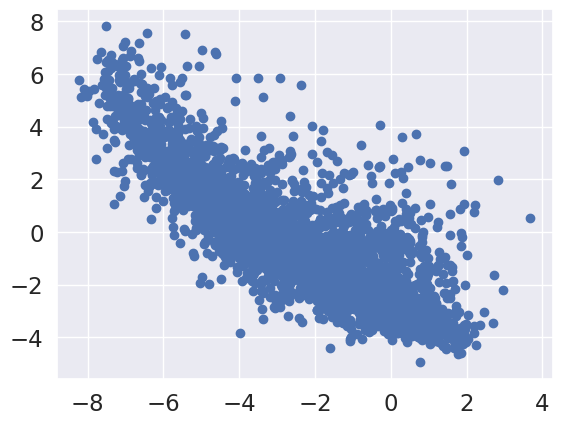

In [ ]:
plt.scatter(model1.B_[:, 0], model1.B_[:, 1], cmap='hot')

# **Regression Based**

In [ ]:
m = movies.copy()
m.head()

,MovieID,Title,Genres,Release_year,Release_Decade
0,1,Toy Story (1995),Animation|Children's|Comedy,1995,90
1,2,Jumanji (1995),Adventure|Children's|Fantasy,1995,90
2,3,Grumpier Old Men (1995),Comedy|Romance,1995,90
3,4,Waiting to Exhale (1995),Comedy|Drama,1995,90
4,5,Father of the Bride Part II (1995),Comedy,1995,90


In [ ]:
u = users.copy()
u.head()

,UserID,Gender,Age,Occupation,Zip-code
0,1,F,Under 18,K-12 student,48067
1,2,M,56+,self-employed,70072
2,3,M,25-34,scientist,55117
3,4,M,45-49,executive/managerial,02460
4,5,M,25-34,writer,55455


In [ ]:
r = ratings.copy()
r.head()

,UserID,MovieID,Rating,Timestamp
0,1,1193,5,978300760
1,1,661,3,978302109
2,1,914,3,978301968
3,1,3408,4,978300275
4,1,2355,5,978824291


In [ ]:
m = pd.concat([movies['MovieID'],genres_df.iloc[:,1:]],axis=1)
m.head()

,MovieID,Action,Adventure,Animation,Children's,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western
0,1,0.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1,2,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,3,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00
3,4,0.00,0.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
4,5,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [ ]:
r['Timestamp']=r['Timestamp'].astype('int32')
r['Rating']=r['Rating'].astype('int32')
r['hour'] = r['Timestamp'].apply(lambda x: datetime.fromtimestamp(x).hour)
r.head()

,UserID,MovieID,Rating,Timestamp,hour
0,1,1193,5,978300760,22
1,1,661,3,978302109,22
2,1,914,3,978301968,22
3,1,3408,4,978300275,22
4,1,2355,5,978824291,23


In [ ]:
u_new = u.merge(r.groupby('UserID')["Rating"].mean().reset_index(), on='UserID')
u_new = u_new.merge(r.groupby('UserID').hour.mean().reset_index(), on='UserID')
u_new.head()

,UserID,Gender,Age,Occupation,Zip-code,Rating,hour
0,1,F,Under 18,K-12 student,48067,4.19,22.25
1,2,M,56+,self-employed,70072,3.71,21.16
2,3,M,25-34,scientist,55117,3.90,21.00
3,4,M,45-49,executive/managerial,02460,4.19,20.00
4,5,M,25-34,writer,55455,3.15,6.02


In [ ]:
u_df = u_new[['UserID', 'Rating', 'hour']].copy()
u_df = u_df.set_index('UserID')
u_df.columns = ['User_avg_rating', 'hour']

In [ ]:
scaler = StandardScaler()
u_df = pd.DataFrame(scaler.fit_transform(u_df), columns=u_df.columns, index=u_df.index)
u_df.head()

,User_avg_rating,hour
UserID,,
1,1.13,1.41
2,0.02,1.26
3,0.46,1.24
4,1.14,1.10
5,-1.29,-0.86


In [ ]:
df_cat = u_new[['Gender','Occupation']]
df_cat['Gender'] = pd.get_dummies(df_cat['Gender'], columns=['Gender'] ,drop_first=True)
df_cat = pd.concat([users['UserID'],df_cat],axis=1)
df_cat.head()

,UserID,Gender,Occupation
0,1,0,K-12 student
1,2,1,self-employed
2,3,1,scientist
3,4,1,executive/managerial
4,5,1,writer


In [ ]:
X = ratings[['MovieID', 'UserID', 'Rating']].copy()
X = X.merge(u.reset_index(), on='UserID', how='right')
X = X.merge(m.reset_index(), on='MovieID', how='right')
X = X.merge(df_cat, on='UserID', how='right')

X.dropna(inplace=True)
X.reset_index(inplace=True,drop=True)
X1=X.copy()
X.head()

,MovieID,UserID,Rating,index_x,Gender_x,Age,Occupation_x,Zip-code,index_y,Action,Adventure,Animation,Children's,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,Gender_y,Occupation_y
0,1,1,5,0.00,F,Under 18,K-12 student,48067,0,0.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,K-12 student
1,48,1,5,0.00,F,Under 18,K-12 student,48067,47,0.00,0.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0,K-12 student
2,150,1,5,0.00,F,Under 18,K-12 student,48067,148,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,K-12 student
3,260,1,4,0.00,F,Under 18,K-12 student,48067,257,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,K-12 student
4,527,1,5,0.00,F,Under 18,K-12 student,48067,523,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0,K-12 student


In [ ]:
X = X.drop(columns = ['MovieID', 'UserID'])
y = X.pop('Rating')

In [ ]:
X

,index_x,Gender_x,Age,Occupation_x,Zip-code,index_y,Action,Adventure,Animation,Children's,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,Gender_y,Occupation_y
0,0.00,F,Under 18,K-12 student,48067,0,0.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,K-12 student
1,0.00,F,Under 18,K-12 student,48067,47,0.00,0.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0,K-12 student
2,0.00,F,Under 18,K-12 student,48067,148,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,K-12 student
3,0.00,F,Under 18,K-12 student,48067,257,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,K-12 student
4,0.00,F,Under 18,K-12 student,48067,523,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0,K-12 student
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995866,6039.00,M,25-34,doctor/health care,11106,3614,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1,doctor/health care
995867,6039.00,M,25-34,doctor/health care,11106,3634,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,1,doctor/health care
995868,6039.00,M,25-34,doctor/health care,11106,3666,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1,doctor/health care
995869,6039.00,M,25-34,doctor/health care,11106,3682,0.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1,doctor/health care


In [ ]:
y

0         5
1         5
2         5
3         4
4         5
         ..
995866    4
995867    4
995868    4
995869    4
995870    5
Name: Rating, Length: 995871, dtype: object

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

model = GradientBoostingRegressor()
model.fit(X_train, y_train)

y_pred = model.predict(X_test) 

In [ ]:
rmse = mse(y_test, y_pred, squared=False) 
print('Root Mean Squared Error: {:.3f}'.format(rmse))

In [ ]:
mape_ =  mape(y_test, y_pred) #calculating mape value
print('Mean Absolute Percentage Error: {:.3f}'.format(mape_))

# **Questionnare**

### ***1. Users of which age group have watched and rated the most number of movies?***

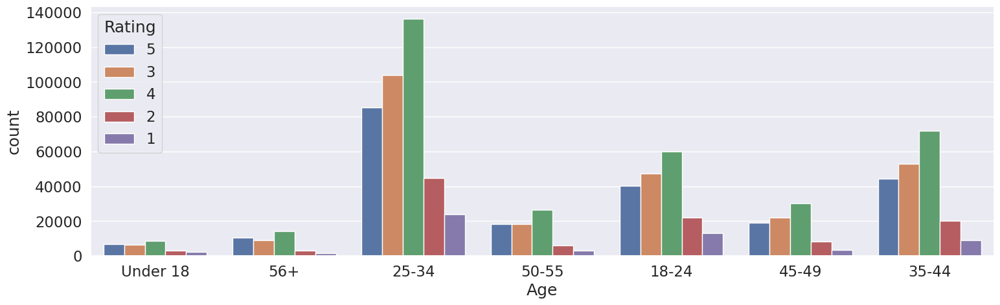

In [ ]:
plt.figure(figsize = (18,5))
sns.countplot(data = df , x = "Age" , hue = "Rating")
plt.show()


In [ ]:
df["Age"].value_counts()

25-34       394105
35-44       198084
18-24       183047
45-49        83161
50-55        72071
56+          38544
Under 18     27132
Name: Age, dtype: int64

**Answer** =  (25-34) age group have watched and rated the most number of movies

### ***2. Users belonging to which profession have watched and rated the most movies?***

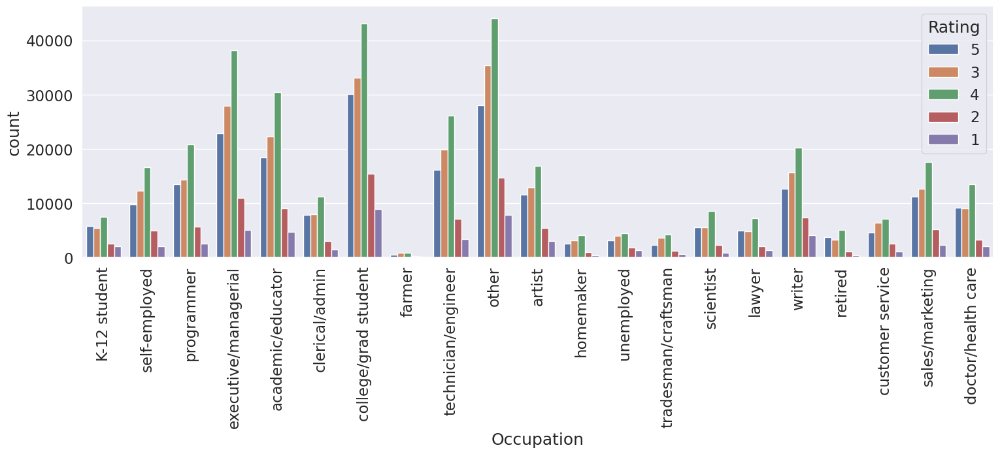

In [ ]:
plt.figure(figsize = (18,5))
sns.countplot(data = df , x = "Occupation" , hue = "Rating")
plt.xticks(rotation = 90)
plt.show()

In [ ]:
df["Occupation"].value_counts().head()

college/grad student    130626
other                   130001
executive/managerial    105013
academic/educator        84936
technician/engineer      72534
Name: Occupation, dtype: int64

**Answer =** "college/grad student"  have watched and rated the most movies

### ***3. Most of the users in our dataset who’ve rated the movies are Male. (T/F)***

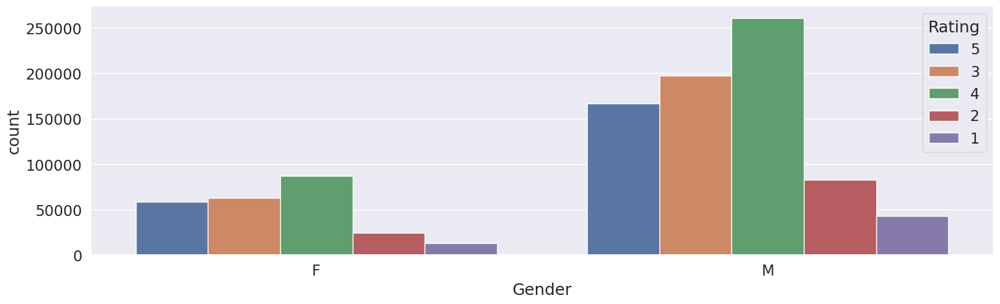

In [ ]:
plt.figure(figsize = (18,5))
sns.countplot(data = df , x = "Gender" , hue = "Rating")
plt.show()

In [ ]:
df["Gender"].value_counts()

M    750590
F    245554
Name: Gender, dtype: int64

**Answer =** True

### ***4. Most of the movies present in our dataset were released in which decade?***


a) 70s

b) 90s 

c) 50s 

d) 80s 

In [ ]:
df["Release_Decade"].value_counts()

90    532115
80    223121
70     82354
60     47060
0      41000
50     34604
40     21501
30     12648
20      1696
10        45
Name: Release_Decade, dtype: int64

**Answer = (b) i.e** Most of the movies present in our dataset were released in **90s** decade

### **5. The movie with maximum no. of ratings is ?**

**Answer =** American Beauty

### **6. Name the top 3 movies similar to ‘Liar Liar’ on the item-based approach.**

**Answer =** 

1) Ace Ventura: Pet, 

2) Mrs. Doubtfire, 

3) Detective Dumb & Dumber



### **7. On the basis of approach, Collaborative Filtering methods can be classified into ___-based and ___-based.**

**Answer =** On the basis of approach, Collaborative Filtering methods can be classified into ***Memory***-based and ***Model***-based.



### **8. Pearson Correlation ranges between ___ to ___ whereas, Cosine Similarity belongs to the interval between ___ to ___.**

**Answer =** Pearson Correlation ranges between ***-1 to 1*** whereas, Cosine Similarity belongs to the interval between ***-1 to 1.***

### **9. Mention the RMSE and MAPE that you got while evaluating the Matrix Factorization model.**

**Answer =** 

The RMSE is **1.05** 

The MAPE is **0.33**

### **10. Give the sparse ‘row’ matrix representation for the following dense matrix -**


[[1 0]

[3 7]]


*-# Dense to sparse*

from numpy import array

from scipy.sparse import csr_matrix

*-# Create dense matrix*

A = array([[1, 0], [3,7]])

print(A)

*-# Convert to sparse matrix (CSR method)*

S = csr_matrix(A)

print(S)

output:- [[1 0] [3 7]]

**(0, 0) 1 (1, 0) 3 (1, 1) 7**

# **Actionable Insights & Recommendations:-**






1.   The target audience for ZEE entertainment is the occupation college/grade students, executives/managers, and others.
2.   Male gives more rating compared to female so with that zee get maximum data to build a robust recommendation model for new all users.


1.   As the female audience is less so in order to increase female audience ZEE can provide free 30 days subscription
2.   ZEE target audience has an age limit of an average of 20-35 years.
